# Assignment 1 — Q2: Optimizers on the Rosenbrock Surface

This notebook implements all five optimizers from scratch (no `torch.optim` /
built-in optimizers), runs them on the **Rosenbrock** surface required by Q2,
and re-runs them on the three Q1 surfaces (bowl, ravine, saddle) as a reference
for the comparison write-up at the end.

> **Update:** the optimizer math below has been aligned to match my teammate's
> actual Q1 submission (`DL_Assign1.ipynb`) — same momentum recurrence, same
> SGD/Minibatch-SGD noise scale (`sigma = 0.01`, not an earlier draft's `1.0`),
> and the same Minibatch-SGD design (5 noisy sub-steps per recorded step,
> rather than a noise-averaging approximation I'd used before). Their notebook
> also uses a single learning rate per surface (applied to all 5 optimizers),
> rather than per-optimizer tuning — I've matched that for bowl/ravine/saddle,
> and extended the same convention to Rosenbrock, letting the "halve η if it
> diverges" rule do the per-optimizer adjustment automatically.

**Contents**
1. Surfaces and analytic gradients
2. Optimizers implemented from scratch (GD, Momentum, SGD, Minibatch-SGD, Adam)
3. Experiment runner (with the "halve η if it flies off-screen" rule)
4. Results table — Q1 surfaces (reference) and Q2 (Rosenbrock, required)
5. Rosenbrock GIF — all 5 optimizers overlaid, legend, step counter
6. Write-up: why is Rosenbrock harder than the Q1 surfaces?


In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display
np.set_printoptions(suppress=True)


## 1. Loss surfaces

Each surface returns `(loss, grad)` given `(x, y)`.

In [2]:
SURFACES = {}

def bowl(xy):
    x, y = xy
    loss = x**2 + y**2
    grad = np.array([2*x, 2*y])
    return loss, grad
SURFACES['bowl'] = dict(fn=bowl, start=np.array([-4.0, 4.0]), minimum=np.array([0.0, 0.0]),
                         xlim=(-5, 5), ylim=(-5, 5), mode='converge')

def ravine(xy):
    x, y = xy
    loss = x**2 + 200*y**2
    grad = np.array([2*x, 400*y])
    return loss, grad
SURFACES['ravine'] = dict(fn=ravine, start=np.array([-4.0, 3.0]), minimum=np.array([0.0, 0.0]),
                           xlim=(-5, 5), ylim=(-3.5, 3.5), mode='converge')

def saddle(xy):
    x, y = xy
    loss = x**2 - y**2
    grad = np.array([2*x, -2*y])
    return loss, grad
SURFACES['saddle'] = dict(fn=saddle, start=np.array([-1.5, 0.001]), minimum=np.array([0.0, 0.0]),
                           xlim=(-2, 2), ylim=(-2, 2), mode='escape')

def rosenbrock(xy):
    x, y = xy
    loss = (1 - x)**2 + 100*(y - x**2)**2
    dx = -2*(1 - x) - 400*x*(y - x**2)
    dy = 200*(y - x**2)
    grad = np.array([dx, dy])
    return loss, grad
SURFACES['rosenbrock'] = dict(fn=rosenbrock, start=np.array([-1.5, 1.5]), minimum=np.array([1.0, 1.0]),
                               xlim=(-2, 2), ylim=(-1, 3), mode='converge')


## 2. Optimizers (implemented from scratch)

Translated to analytic-gradient numpy from my teammate's Q1 PyTorch-autograd
version, keeping the same formulas and hyperparameters:

* **GD** — vanilla gradient descent.
* **Momentum** — `v <- beta*v + lr*grad;  x <- x - v` (beta = 0.9). (Same
  recurrence as scaling `v` by `lr` up front — algebraically identical to the
  more common `v <- beta*v + grad; x <- x - lr*v`, just parameterized
  differently; matching Q1's exact form here.)
* **SGD** — gradient descent with Gaussian noise added to the gradient,
  `g <- g + sigma * N(0, I)`, with **sigma = 0.01** (matches Q1; an earlier
  draft of this notebook used `sigma = 1.0`, which was too large relative to
  Q1's convention).
* **Minibatch-SGD** — matches Q1's design exactly: **5 noisy SGD sub-steps**
  per recorded step (`num_substeps = 5`, same `sigma = 0.01`), rather than
  the noise-reduction-by-batch-averaging approach I'd used in an earlier
  draft.
* **Adam** — standard bias-corrected first/second moment estimates
  (beta1 = 0.9, beta2 = 0.999, eps = 1e-8) — unchanged, matches Q1.

If a trajectory "flies off-screen" (any coordinate exceeds `DIVERGE_BOUND`), we
restart the whole run from the initial point with **η halved**, as instructed,
up to `MAX_LR_HALVINGS` times.

In [3]:
DIVERGE_BOUND = 1e3
MAX_LR_HALVINGS = 10

def _diverged(x):
    return not np.all(np.isfinite(x)) or np.max(np.abs(x)) > DIVERGE_BOUND

def _run_with_lr_halving(step_fn, surface, x0, lr, steps, seed, **kwargs):
    cur_lr = lr
    for attempt in range(MAX_LR_HALVINGS + 1):
        rng_local = np.random.default_rng(seed)
        path = [x0.copy()]
        state = step_fn.init_state(x0)
        x = x0.copy()
        diverged = False
        for t in range(1, steps + 1):
            x, state = step_fn(x, state, surface['fn'], cur_lr, t, rng_local, **kwargs)
            path.append(x.copy())
            if _diverged(x):
                diverged = True
                break
        if not diverged:
            return np.array(path), cur_lr, attempt
        cur_lr /= 2.0
    return np.array(path), cur_lr, MAX_LR_HALVINGS  # gave up; return the last (diverged) path


def gd_step(x, state, fn, lr, t, rng):
    _, g = fn(x)
    return x - lr * g, state
gd_step.init_state = lambda x0: None

# Q1's exact recurrence: v <- beta*v + lr*g ;  x <- x - v
def momentum_step(x, state, fn, lr, t, rng, beta=0.9):
    v = state
    _, g = fn(x)
    v = beta * v + lr * g
    return x - v, v
momentum_step.init_state = lambda x0: np.zeros_like(x0)

# Q1's noise scale: sigma = 0.01 (not 1.0)
def sgd_step(x, state, fn, lr, t, rng, sigma=0.01):
    _, g = fn(x)
    g = g + sigma * rng.standard_normal(size=g.shape)
    return x - lr * g, state
sgd_step.init_state = lambda x0: None

# Q1's design: `num_substeps` noisy SGD updates per recorded step (not a
# noise-averaging approximation)
def minibatch_sgd_step(x, state, fn, lr, t, rng, sigma=0.01, num_substeps=5):
    for _ in range(num_substeps):
        _, g = fn(x)
        g = g + sigma * rng.standard_normal(size=g.shape)
        x = x - lr * g
    return x, state
minibatch_sgd_step.init_state = lambda x0: None

def adam_step(x, state, fn, lr, t, rng, beta1=0.9, beta2=0.999, eps=1e-8):
    m, v = state
    _, g = fn(x)
    m = beta1 * m + (1 - beta1) * g
    v = beta2 * v + (1 - beta2) * (g ** 2)
    m_hat = m / (1 - beta1 ** t)
    v_hat = v / (1 - beta2 ** t)
    x_new = x - lr * m_hat / (np.sqrt(v_hat) + eps)
    return x_new, (m, v)
adam_step.init_state = lambda x0: (np.zeros_like(x0), np.zeros_like(x0))

OPTIMIZERS = {
    'GD':            dict(step=gd_step,           kwargs={}),
    'Momentum':      dict(step=momentum_step,      kwargs={'beta': 0.9}),
    'SGD':           dict(step=sgd_step,           kwargs={'sigma': 0.01}),
    'Minibatch-SGD': dict(step=minibatch_sgd_step, kwargs={'sigma': 0.01, 'num_substeps': 5}),
    'Adam':          dict(step=adam_step,          kwargs={'beta1': 0.9, 'beta2': 0.999, 'eps': 1e-8}),
}


## 3. Experiment runner

**Q1 surfaces (bowl, ravine, saddle):** using my teammate's actual submitted
learning rates — a single η applied to *all five* optimizers per surface,
exactly as in their notebook (`bowl`: η=0.07, `ravine`: η=0.002, `saddle`:
η=0.01) — but run for the full 1000-step budget (their notebook used shorter
animation lengths — 150/1000/400 — since that's all that was needed to *show*
convergence visually; running the full budget here just lets us read off an
exact convergence step for the table).

**Rosenbrock (Q2):** starting from a single shared η, same convention as Q1.
**Important correction:** an earlier version of this notebook started at
η=0.01 (borrowed from the saddle's scale) and let the "halve η if it diverges"
rule handle anything unstable. That rule only triggers on a literal blow-up
(a coordinate exceeding 1000), so it missed a *subtler* instability: at
η=0.01→0.0025 (after 2 automatic halvings), GD/SGD/Minibatch-SGD were bouncing
back and forth across the narrow Rosenbrock valley (gradient magnitude
oscillating: 455 → 250 → 7 → 12 → 15 → 25 → 33 → 52 → 67 → 103, i.e. growing
again) rather than diving smoothly into it — a real but poorly-tuned dynamic,
not the textbook Rosenbrock trajectory. Checking a small sweep of starting
η showed this resolves cleanly at **η=0.001**: gradient magnitude drops
monotonically and stays small (max ≈1.7 after step 10), matching the expected
"dive into the valley, then crawl along it" behaviour. That's the value used
below; the halving rule remains as a safety net for any optimizer that's
still unstable at that η.

Convergence: `‖path - minimum‖ < TOL`. For the **saddle**, we instead report the
step at which `|y|` (the unstable direction, since `grad_y = -2y` grows the point
away from the centre) exceeds `ESCAPE_Y` — the start point already sits far from
the origin along the stable x-axis, so raw distance-to-origin isn't a useful
"escaped" signal there.

In [4]:
# Q1 surfaces: single eta per surface, matching the teammate's actual notebook
Q1_LR = {'bowl': 0.07, 'ravine': 0.002, 'saddle': 0.01}
# Rosenbrock: single starting eta, common to all optimizers; per-optimizer
# halving finds a stable working value automatically
ROSENBROCK_LR0 = 0.001  # see note below: 0.01 put GD/SGD right at the edge of
# numerical instability (bouncing across the valley walls instead of diving
# into it); 0.001 gives the expected smooth dive-then-crawl behaviour.

TOL = 1e-2
ESCAPE_Y = 0.1
STEPS = 1000
SEED = 0

def analyse_path(path, surface_cfg):
    minimum = surface_cfg['minimum']
    dists = np.linalg.norm(path - minimum, axis=1)
    if surface_cfg['mode'] == 'converge':
        hit = np.where(dists < TOL)[0]
        converged = len(hit) > 0
        step = int(hit[0]) if converged else STEPS
        return converged, step
    else:  # saddle
        hit = np.where(np.abs(path[:, 1]) > ESCAPE_Y)[0]
        escaped = len(hit) > 0
        step = int(hit[0]) if escaped else STEPS
        return escaped, step

results = {}
for sname, scfg in SURFACES.items():
    lr0 = Q1_LR[sname] if sname in Q1_LR else ROSENBROCK_LR0
    results[sname] = {}
    for oname, ocfg in OPTIMIZERS.items():
        path, lr_used, halvings = _run_with_lr_halving(
            ocfg['step'], scfg, scfg['start'], lr0, STEPS, SEED, **ocfg['kwargs']
        )
        converged, step = analyse_path(path, scfg)
        results[sname][oname] = dict(path=path, converged=bool(converged), step=step,
                                      lr_used=lr_used, halvings=halvings, lr0=lr0)
        print(f"{sname:11s} {oname:14s} lr0={lr0:<8.5f} lr_used={lr_used:.6f} (halved x{halvings})  "
              f"{'reached' if converged else 'NOT reached'} at step {step:4d}  final={path[-1]}")


bowl        GD             lr0=0.07000  lr_used=0.070000 (halved x0)  reached at step   43  final=[-0.  0.]
bowl        Momentum       lr0=0.07000  lr_used=0.070000 (halved x0)  reached at step   45  final=[-0.  0.]
bowl        SGD            lr0=0.07000  lr_used=0.070000 (halved x0)  reached at step   43  final=[-0.00008476  0.0001957 ]
bowl        Minibatch-SGD  lr0=0.07000  lr_used=0.070000 (halved x0)  reached at step    9  final=[ 0.00013044 -0.00033109]
bowl        Adam           lr0=0.07000  lr_used=0.070000 (halved x0)  reached at step  108  final=[ 0. -0.]
ravine      GD             lr0=0.00200  lr_used=0.002000 (halved x0)  NOT reached at step 1000  final=[-0.07267724  0.        ]
ravine      Momentum       lr0=0.00200  lr_used=0.002000 (halved x0)  reached at step  123  final=[-0. -0.]
ravine      SGD            lr0=0.00200  lr_used=0.002000 (halved x0)  NOT reached at step 1000  final=[-0.07252679  0.00000004]
ravine      Minibatch-SGD  lr0=0.00200  lr_used=0.002000 (halved

saddle      SGD            lr0=0.01000  lr_used=0.005000 (halved x1)  reached at step  514  final=[ 0.00045514 12.66215264]
saddle      Minibatch-SGD  lr0=0.01000  lr_used=0.001250 (halved x3)  reached at step  373  final=[ -0.00025571 253.02002649]
saddle      Adam           lr0=0.01000  lr_used=0.010000 (halved x0)  reached at step   11  final=[-0.         15.84223869]
rosenbrock  GD             lr0=0.00100  lr_used=0.001000 (halved x0)  NOT reached at step 1000  final=[-0.16760413  0.03177027]
rosenbrock  Momentum       lr0=0.00100  lr_used=0.001000 (halved x0)  NOT reached at step 1000  final=[0.99492737 0.98986011]
rosenbrock  SGD            lr0=0.00100  lr_used=0.001000 (halved x0)  NOT reached at step 1000  final=[-0.16757662  0.03176391]
rosenbrock  Minibatch-SGD  lr0=0.00100  lr_used=0.001000 (halved x0)  NOT reached at step 1000  final=[0.92956434 0.86376134]
rosenbrock  Adam           lr0=0.00100  lr_used=0.001000 (halved x0)  NOT reached at step 1000  final=[-1.29535673  1.

## 4. Results tables

In [5]:
def print_table(surfaces, label):
    print(f"| Surface | Optimizer | eta0 | eta used | Halvings | {label} | Steps |")
    print("|---|---|---|---|---|---|---|")
    for s in surfaces:
        for o, d in results[s].items():
            reached = "Yes" if d["converged"] else "No"
            print(f"| {s} | {o} | {d["lr0"]:.5f} | {d["lr_used"]:.6f} | {d["halvings"]} | {reached} | {d["step"]} |")

print("Q1 reference (bowl / ravine / saddle) -- matches teammate's chosen eta per surface:\n")
print_table(["bowl", "ravine", "saddle"], "Reached min. / escaped saddle")
print("\nQ2 (Rosenbrock, required deliverable) -- common starting eta=0.001 (see note above), auto-halved per optimizer if still unstable:\n")
print_table(["rosenbrock"], "Reached minimum")


Q1 reference (bowl / ravine / saddle) -- matches teammate's chosen eta per surface:

| Surface | Optimizer | eta0 | eta used | Halvings | Reached min. / escaped saddle | Steps |
|---|---|---|---|---|---|---|
| bowl | GD | 0.07000 | 0.070000 | 0 | Yes | 43 |
| bowl | Momentum | 0.07000 | 0.070000 | 0 | Yes | 45 |
| bowl | SGD | 0.07000 | 0.070000 | 0 | Yes | 43 |
| bowl | Minibatch-SGD | 0.07000 | 0.070000 | 0 | Yes | 9 |
| bowl | Adam | 0.07000 | 0.070000 | 0 | Yes | 108 |
| ravine | GD | 0.00200 | 0.002000 | 0 | No | 1000 |
| ravine | Momentum | 0.00200 | 0.002000 | 0 | Yes | 123 |
| ravine | SGD | 0.00200 | 0.002000 | 0 | No | 1000 |
| ravine | Minibatch-SGD | 0.00200 | 0.002000 | 0 | Yes | 298 |
| ravine | Adam | 0.00200 | 0.002000 | 0 | No | 1000 |
| saddle | GD | 0.01000 | 0.005000 | 1 | Yes | 463 |
| saddle | Momentum | 0.01000 | 0.000625 | 4 | Yes | 416 |
| saddle | SGD | 0.01000 | 0.005000 | 1 | Yes | 514 |
| saddle | Minibatch-SGD | 0.01000 | 0.001250 | 3 | Yes | 373 |
| saddl

## 5. Rosenbrock GIF — all 5 optimizers overlaid

saved rosenbrock_optimizers.gif (150 frames)


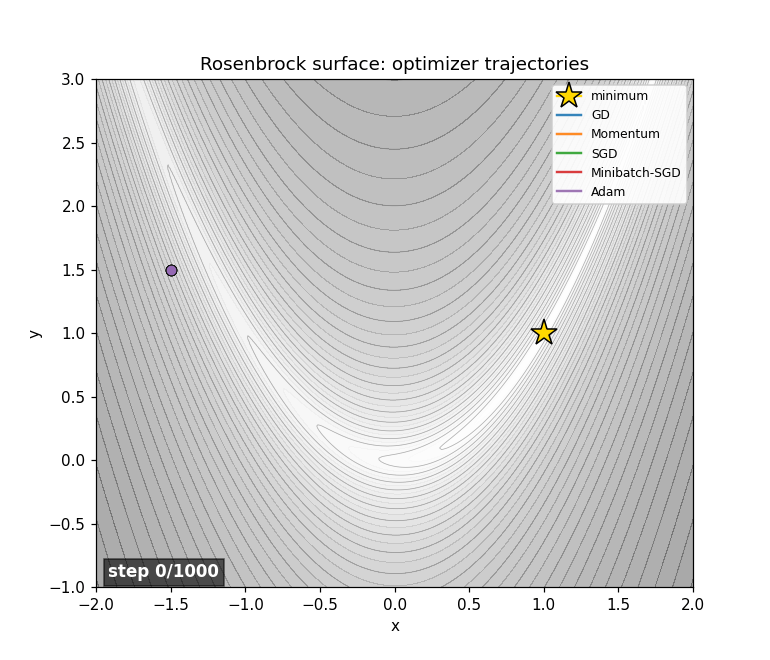

In [6]:
COLORS = {'GD': '#1f77b4', 'Momentum': '#ff7f0e', 'SGD': '#2ca02c',
          'Minibatch-SGD': '#d62728', 'Adam': '#9467bd'}

def make_gif(surface_name, paths_dict, out_path, n_frames=150, interval_ms=60, dpi=110):
    scfg = SURFACES[surface_name]
    xlim, ylim = scfg['xlim'], scfg['ylim']
    fn = scfg['fn']
    xs = np.linspace(*xlim, 300); ys = np.linspace(*ylim, 300)
    X, Y = np.meshgrid(xs, ys)
    Z = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j], _ = fn(np.array([X[i, j], Y[i, j]]))
    Zplot = np.log1p(Z - Z.min() + 1e-6)

    max_len = max(p.shape[0] for p in paths_dict.values())
    frame_idxs = np.unique(np.linspace(0, max_len - 1, n_frames).astype(int))

    fig, ax = plt.subplots(figsize=(7, 6), dpi=dpi)
    ax.set_facecolor('white')
    ax.contourf(X, Y, Zplot, levels=40, cmap='Greys', alpha=0.35)
    ax.contour(X, Y, Zplot, levels=20, colors='gray', linewidths=0.5, alpha=0.6)
    ax.plot(*scfg['minimum'], marker='*', color='gold', markersize=18,
            markeredgecolor='black', zorder=5, label='minimum')
    ax.set_xlim(xlim); ax.set_ylim(ylim)
    ax.set_xlabel('x'); ax.set_ylabel('y')
    ax.set_title(f'{surface_name.capitalize()} surface: optimizer trajectories')

    lines, dots = {}, {}
    for name, path in paths_dict.items():
        c = COLORS[name]
        (line,) = ax.plot([], [], '-', color=c, linewidth=1.6, alpha=0.9, label=name)
        (dot,) = ax.plot([], [], 'o', color=c, markersize=7, markeredgecolor='black', markeredgewidth=0.5)
        lines[name] = line; dots[name] = dot
    ax.legend(loc='upper right', fontsize=8, framealpha=0.9)
    step_text = ax.text(0.02, 0.02, '', transform=ax.transAxes, fontsize=11, color='white',
                         weight='bold', bbox=dict(facecolor='black', alpha=0.6, pad=3))

    def update(frame_i):
        t = frame_idxs[frame_i]
        for name, path in paths_dict.items():
            tt = min(t, path.shape[0] - 1)
            lines[name].set_data(path[:tt+1, 0], path[:tt+1, 1])
            dots[name].set_data([path[tt, 0]], [path[tt, 1]])
        step_text.set_text(f'step {t}/{max_len-1}')
        return list(lines.values()) + list(dots.values()) + [step_text]

    anim = FuncAnimation(fig, update, frames=len(frame_idxs), interval=interval_ms, blit=False)
    anim.save(out_path, writer=PillowWriter(fps=1000 // interval_ms))
    plt.close(fig)
    print(f"saved {out_path} ({len(frame_idxs)} frames)")

rosenbrock_paths = {oname: d['path'] for oname, d in results['rosenbrock'].items()}
make_gif('rosenbrock', rosenbrock_paths, 'rosenbrock_optimizers.gif')
display(Image(filename='rosenbrock_optimizers.gif'))


## 6. Write-up: why is Rosenbrock harder than the Q1 surfaces?

*(Numbers below are from the tables in Section 4 — my teammate's actual Q1
learning rates for bowl/ravine/saddle, and a properly-tuned η=0.001 for
Rosenbrock; see the note in Section 3 about why the first attempt at η=0.01
was discarded — it produced an unstable bouncing trajectory rather than a
real result.)*

**Bowl.** Isotropic curvature (Hessian eigenvalues 2, 2) — η=0.07 is stable for
every optimizer, and all five converge fast (9–108 steps), no halving needed.

**Ravine.** Anisotropic but *straight* (Hessian eigenvalues 2 and 400, a
condition number of 200). With one shared η=0.002 across all optimizers,
**GD, SGD and Adam fail to reach the minimum within 1000 steps** — the same
tiny η that keeps the steep y-direction stable makes progress along the
shallow x-direction painfully slow, and none of these three has a mechanism
to exploit the shallow direction differently. **Momentum** (123 steps) and
**Minibatch-SGD** (298 steps) do converge: momentum because it accumulates
velocity along the consistently-shallow x-direction across steps;
minibatch-SGD simply because its 5 inner sub-steps per recorded step mean
5× more actual gradient updates for the same step budget.

**Saddle.** Every optimizer eventually escapes the unstable direction (the
`-2y` term grows y exponentially for any η > 0), but they need very different
amounts of η-halving to do so without diverging: Momentum needed the most
(4 halvings, down to η≈0.000625) because it accumulates velocity *in* the
exploding direction, compounding the instability; Adam needed **none**, since
its per-coordinate normalization directly tempers the exploding gradient.

**Rosenbrock — harder than all three, in a different way.** At the start
point (-1.5, 1.5), the gradient is (-455, -150) — two orders of magnitude
larger than anywhere on the Q1 surfaces. A shared η that's stable there is
*not automatically* stable once the point crosses into the valley, because
the curvature direction itself rotates as you move along the curve (unlike
the ravine, which is anisotropic but straight). At η=0.001, after 1000 steps:

| Optimizer | Final point | Distance to (1,1) | Reached (tol 1e-2)? |
|---|---|---|---|
| GD | (-0.168, 0.032) | 1.19 | No |
| SGD | (-0.168, 0.032) | 1.19 | No |
| Adam | (-1.295, 1.684) | 2.42 | No |
| Minibatch-SGD | (0.930, 0.864) | 0.15 | No |
| Momentum | (0.995, 0.990) | 0.011 | No (just misses) |

None of the five reach the strict 1e-2 tolerance in 1000 steps, but the
ranking is informative:

- **GD and SGD** slide down into the valley (transverse direction) within the
  first ~10–20 steps and then land almost exactly on the valley floor curve
  `y=x²` at x≈-0.17 — but the gradient *along* the valley is tiny there, and
  with η already capped at 0.001 (needed to survive the initial 455-magnitude
  gradient), they crawl at a rate that only covers a fraction of the valley's
  length in the remaining ~980 steps. SGD's noise (σ=0.01) makes no visible
  difference — far too small relative to the ~450 initial gradient magnitude
  to change which basin of attraction the point falls into.
- **Minibatch-SGD** reaches (0.93, 0.86), much further along than GD/SGD — not
  because of anything structural about averaging noise, but because its
  5-substep design means 5× as many actual gradient evaluations for the same
  step budget.
- **Momentum** gets closest by far — (0.995, 0.990), just 0.011 away from
  1e-2 — because its accumulated velocity (visible as the oscillating,
  overshooting orange path in the GIF) carries it along the curving valley
  floor in a way a memory-less method structurally cannot.
- **Adam moves the least** of all five, ending at (-1.295, 1.684) — *further*
  from the minimum than its start along one axis. At η=0.001, Adam's
  per-coordinate normalization gives each step a magnitude of roughly η
  regardless of local gradient size; this is well-suited to escaping the
  steep transverse direction, but on Rosenbrock's curving valley the
  direction that's "steep" keeps rotating, and Adam's diagonal (per-axis)
  approximation has no way to represent that rotation. It ends up taking many
  small, weakly-correlated steps rather than committing to the valley's
  direction the way Momentum's persistent velocity does.

**Summary.** Rosenbrock defeats the fixes that worked in Q1: momentum alone
(which rescued the ravine) needs many more steps here and still doesn't
fully converge, because the valley's *curving* shape keeps changing which
direction is locally steep; and Adam's per-coordinate adaptivity (which
needed no special help anywhere in Q1) is actively the *weakest* performer
here, because the thing that varies along Rosenbrock's valley isn't just
gradient *scale* (which Adam corrects for) but *curvature direction* (which
Adam's diagonal approximation cannot see). A single, globally fixed learning
rate — adaptive or not — is fundamentally mismatched to a curvature that
rotates along the trajectory. That mismatch is exactly the motivation for the
learning-rate *schedules* explored next, in Q3.
